# Exploratory Analysis - EDA

Dataprep.EDA
* Main Site - https://dataprep.ai/
* Docs - https://docs.dataprep.ai/user_guide/eda/introduction.html

## Table of Contents

[EDA DF](#eda_df)
* [Basic Data Overview](#basic_data_overview)  
* [General Exploration - Dataprep.EDA](#dataprep)  
* [Specific Questions:](#specific_questions)
    * [Average Point Spread Error Per Game Over Time](#apsepgot)  

[Game Records](#game_records)
* [Data Overview](#data_overview)  
* [Specific Questions:](#specific_questions_2)
    * [Model Performance Over Time](#mpot)
    * [Distributions of Model Predictions, Vegas Predictions, and Game Results](#dmpvpgp)
    * [Overall Winning vs. Losing Predictions](#owvlp)
    * [Win Percentage vs. Prediction Margin](#wpvpm)
    
[Other](#other)
* [Model Performance](#model)

## Imports and Global Settings

In [1]:
import sys
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from sqlalchemy import create_engine
from dataprep.eda import plot, plot_correlation, plot_missing, create_report
import warnings
warnings.filterwarnings('ignore')

sys.path.append('../')
from ..passkeys import RDS_ENDPOINT, RDS_PASSWORD

# Pandas Settings
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.options.display.max_info_columns = 200
pd.options.display.precision = 5

# Graphing Settings
sns.set_theme()

NumExpr defaulting to 4 threads.


## Database Connection

In [2]:
username = 'postgres'
password = RDS_PASSWORD
endpoint = RDS_ENDPOINT
database = 'nba_betting'
port = '5432'

connection = create_engine(f'postgresql+psycopg2://{username}:{password}@{endpoint}/{database}').connect()

### Datasets

In [3]:
game_records = pd.read_sql_table('game_records', connection)
eda_df = pd.read_sql_table('combined_data_inbound', connection)

<a id='eda_df'></a>

# EDA_DF

## Setting up Targets and Features

In [4]:
eda_df.insert(10, 'pred_home_margin', 0 - eda_df['home_spread'])

In [5]:
eda_df.insert(11, 'actual_home_margin', eda_df['home_score'] - eda_df['away_score'])

In [6]:
eda_df.insert(12, 'spread_miss', eda_df['actual_home_margin'] - eda_df['pred_home_margin'])

In [7]:
eda_df.insert(13, 'abs_spread_miss', eda_df['spread_miss'].abs())

<a id='basic_data_overview'></a>

## Basic Data Overview

In [8]:
eda_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19836 entries, 0 to 19835
Data columns (total 88 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   game_id                19836 non-null  object        
 1   game_date              19836 non-null  datetime64[ns]
 2   home_team              19836 non-null  object        
 3   away_team              19836 non-null  object        
 4   home_score             19803 non-null  float64       
 5   away_score             19803 non-null  float64       
 6   home_result            19245 non-null  object        
 7   covers_game_url        19836 non-null  object        
 8   league_year            19256 non-null  object        
 9   home_spread            19245 non-null  float64       
 10  pred_home_margin       19245 non-null  float64       
 11  actual_home_margin     19803 non-null  float64       
 12  spread_miss            19245 non-null  float64       
 13  a

In [9]:
eda_df.describe()

,home_score,away_score,home_spread,pred_home_margin,actual_home_margin,spread_miss,abs_spread_miss,wins,losses,win_pct,expected_wins,expected_losses,home_ppg,home_papg,away_wins,away_losses,away_win_pct,away_expected_wins,away_expected_losses,away_ppg,away_papg,g,mp,pts,ast,trb,blk,stl,tov,pf,drb,orb,fg,fga,fg_pct,fg2,fg2a,fg2_pct,fg3,fg3a,fg3_pct,ft,fta,ft_pct,away_g,away_mp,away_pts,away_ast,away_trb,away_blk,away_stl,away_tov,away_pf,away_drb,away_orb,away_fg,away_fga,away_fg_pct,away_fg2,away_fg2a,away_fg2_pct,away_fg3,away_fg3a,away_fg3_pct,away_ft,away_fta,away_fta_pct,open_line_home,open_line_away,fd_line_home,fd_line_price_home,fd_line_away,fd_line_price_away,dk_line_home,dk_line_price_home,dk_line_away,dk_line_price_away,covers_consenses_home,covers_consenses_away
count,19803.00000,19803.00000,19245.00000,19245.00000,19803.00000,19245.00000,19245.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19608.00000,19608.00000,19608.00000,19608.00000,19608.00000,19608.00000,19608.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19589.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,19611.00000,586.00000,586.00000,589.00000,589.00000,590.00000,590.00000,563.00000,563.00000,564.00000,564.0000,590.00000,590.00000
mean,104.66399,101.93087,-2.87745,2.87745,2.73312,-0.10660,9.49039,22.04334,20.60320,0.50729,21.98086,20.66573,102.86089,102.65267,22.10720,20.50316,0.51119,22.05992,20.55049,102.90268,102.56892,42.64654,10309.00863,4400.61642,954.76507,1836.02930,210.34570,324.98795,590.64832,880.02445,1381.73551,454.29379,1633.33963,3578.90015,0.45429,1264.22773,2546.07249,0.49588,369.11190,1032.82766,0.35400,764.82526,1003.21093,0.76149,42.61639,10301.78471,4395.22906,954.52430,1835.41237,209.66794,323.93029,589.90934,877.10815,1382.04125,453.37112,1632.10662,3576.10275,0.45448,1263.64132,2544.97807,0.49593,368.46530,1031.12467,0.35450,762.55051,1000.74912,0.76124,-2.17747,2.17747,-2.25297,-109.92360,2.25085,-110.12034,-2.14387,-109.64476,2.14628,-110.0000,0.51256,0.48576
std,13.15890,13.24555,6.40345,6.40345,13.69966,12.15259,7.59110,15.37386,13.36177,0.18320,15.14776,13.24103,7.06669,6.89746,15.34644,13.36685,0.18403,15.14026,13.22843,7.04627,6.91634,24.30436,5875.51608,2548.43524,564.57477,1050.92041,125.42013,189.70892,333.42401,501.04900,795.72065,264.79620,945.17805,2045.33826,0.01985,732.72184,1470.62933,0.03038,252.60856,693.54240,0.03012,448.10308,586.13024,0.03715,24.29789,5873.95213,2541.32314,562.46999,1049.86337,124.25353,188.64724,332.76226,498.98425,795.26127,263.86165,943.21059,2043.36475,0.01977,731.96758,1470.15826,0.02999,250.55426,689.76915,0.03011,446.31127,584.33122,0.03630,6.25478,6.25478,6.36734,2.36599,6.36214,2.38432,6.40241,11.40323,6.39697,4.0314,0.15243,0.15227
min,59.00000,54.00000,-22.50000,-17.50000,-58.00000,-60.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,59.00000,70.00000,0.00000,0.00000,0.00000,0.00000,0.00000,71.00000,66.00000,1.00000,240.00000,59.00000,10.00000,28.00000,0.00000,1.00000,6.00000,11.00000,20.00000,3.00000,23.00000,59.00000,0.29800,15.00000,41.00000,0.27300,0.00000,7.00000,0.00000,3.00000,8.00000,0.37500,1.00000,240.00000,71.00000,10.00000,25.00000,0.00000,1.00000,7.00000,13.00000,19.00000,2.00000,27.00000,69.00000,0.30900,18.00000,38.00000,0.34700,0.00000,5.00000,0.00000,5.00000,9.00000,0.38700,-16.00000,-14.50000,-16.50000,-118.00000,-14.50000,-118.00000,-16.50000,-115.00000,-14.00000,-170.0000,0.00000,0.00000
25%,96.00000,93.00000,-7.50000,-2.50000,-7.00000,-8.00000,3.50000,10.00000,9.00000,0.38500,

In [10]:
eda_df.head()

,game_id,game_date,home_team,away_team,home_score,away_score,home_result,covers_game_url,league_year,home_spread,pred_home_margin,actual_home_margin,spread_miss,abs_spread_miss,home_spread_result,pred_date,wins,losses,win_pct,expected_wins,expected_losses,home_ppg,home_papg,away_wins,away_losses,away_win_pct,away_expected_wins,away_expected_losses,away_ppg,away_papg,g,mp,pts,ast,trb,blk,stl,tov,pf,drb,orb,fg,fga,fg_pct,fg2,fg2a,fg2_pct,fg3,fg3a,fg3_pct,ft,fta,ft_pct,away_g,away_mp,away_pts,away_ast,away_trb,away_blk,away_stl,away_tov,away_pf,away_drb,away_orb,away_fg,away_fga,away_fg_pct,away_fg2,away_fg2a,away_fg2_pct,away_fg3,away_fg3a,away_fg3_pct,away_ft,away_fta,away_fta_pct,open_line_home,open_line_away,fd_line_home,fd_line_price_home,fd_line_away,fd_line_price_away,dk_line_home,dk_line_price_home,dk_line_away,dk_line_price_away,covers_consenses_home,covers_consenses_away
0,20211020NYKBOS,2021-10-20,NYK,BOS,138.0,134.0,W,/sport/basketball/nba/boxscore/250532,2021-2022,-2.5,2.5,4.0,1.5,1.5,W,2021-10-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20211101NYKTOR,2021-11-01,NYK,TOR,104.0,113.0,L,/sport/basketball/nba/boxscore/250657,2021-2022,-7.0,7.0,-9.0,-16.0,16.0,L,2021-10-31,5.0,1.0,0.833,4.0,2.0,117.0,109.8,4.0,3.0,0.571,4.0,3.0,103.7,99.7,6.0,1490.0,702.0,143.0,276.0,38.0,46.0,77.0,122.0,218.0,58.0,254.0,546.0,0.465,154.0,300.0,0.513,100.0,246.0,0.407,94.0,129.0,0.729,7.0,1680.0,726.0,138.0,339.0,25.0,78.0,93.0,130.0,238.0,101.0,274.0,643.0,0.426,200.0,415.0,0.482,74.0,228.0,0.325,104.0,139.0,0.748,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20211110CHIDAL,2021-11-10,CHI,DAL,117.0,107.0,W,/sport/basketball/nba/boxscore/250723,2021-2022,-3.5,3.5,10.0,6.5,6.5,W,2021-11-09,7.0,3.0,0.700,7.0,3.0,108.9,101.9,7.0,3.0,0.700,4.0,6.0,102.4,104.7,10.0,2400.0,1089.0,229.0,446.0,54.0,88.0,119.0,175.0,352.0,94.0,403.0,873.0,0.462,308.0,604.0,0.510,95.0,269.0,0.353,188.0,219.0,0.858,10.0,2400.0,1024.0,205.0,459.0,46.0,67.0,129.0,198.0,355.0,104.0,377.0,874.0,0.431,251.0,477.0,0.526,126.0,397.0,0.317,144.0,203.0,0.709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20211108CHIBKN,2021-11-08,CHI,BKN,118.0,95.0,W,/sport/basketball/nba/boxscore/250706,2021-2022,1.0,-1.0,23.0,24.0,24.0,W,2021-11-07,6.0,3.0,0.667,6.0,3.0,107.9,102.7,7.0,3.0,0.700,6.0,4.0,106.1,103.3,9.0,2160.0,971.0,208.0,390.0,49.0,80.0,110.0,158.0,311.0,79.0,357.0,775.0,0.461,271.0,537.0,0.505,86.0,238.0,0.361,171.0,199.0,0.859,10.0,2400.0,1061.0,245.0,457.0,54.0,61.0,147.0,189.0,386.0,71.0,390.0,834.0,0.468,259.0,487.0,0.532,131.0,347.0,0.378,150.0,193.0,0.777,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20211112BOSMIL,2021-11-12,BOS,MIL,122.0,113.0,W,/sport/basketball/nba/boxscore/250734,2021-2022,-5.5,5.5,9.0,3.5,3.5,W,2021-11-11,5.0,6.0,0.455,6.0,5.0,108.4,108.2,6.0,6.0,0.500,6.0,6.0,108.1,107.9,11.0,2765.0,1192.0,250.0,499.0,72.0,94.0,152.0,219.0,386.0,113.0,439.0,1011.0,0.434,301.0,597.0,0.504,138.0,414.0,0.333,176.0,228.0,0.772,12.0,2880.0,1297.0,261.0,557.0,54.0,91.0,155.0,217.0,433.0,124.0,475.0,1082.0,0.439,300.0,592.0,0.507,175.0,490.0,0.357,172.0,233.0,0.738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<a id=dataprep></a>

## Dataprep.EDA General Exploration

In [11]:
# Excluding live odds data.
# Low amounts of non-nulls causing divide by zero errors in dataprep report creation.

# dataprep_report = create_report(eda_df.drop(columns=['open_line_home',
#        'open_line_away', 'fd_line_home', 'fd_line_price_home', 'fd_line_away',
#        'fd_line_price_away', 'dk_line_home', 'dk_line_price_home',
#        'dk_line_away', 'dk_line_price_away', 'covers_consenses_home',
#        'covers_consenses_away']), title='NBA Betting Data Overview')

In [12]:
# dataprep_report.show_browser()

  0%|          | 0/15668 [00:00<?, ?it/s]


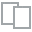
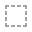
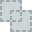
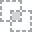
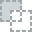
...
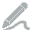
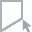
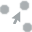
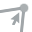
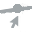

In [13]:
plot(eda_df)

## Comparing Features to Target

In [14]:
feature_to_compare = 'away_expected_wins'

  0%|          | 0/10 [00:00<?, ?it/s]


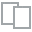
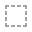
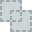
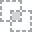
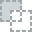
...
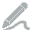
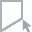
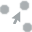
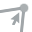
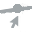

In [15]:
plot(eda_df, feature_to_compare, 'abs_spread_miss')

  0%|          | 0/12 [00:00<?, ?it/s]


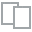
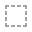
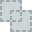
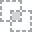
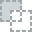
...
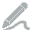
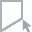
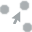
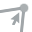
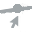

In [16]:
plot_correlation(eda_df, feature_to_compare, 'abs_spread_miss')

<a id=specific_questions></a>

## Specific Questions

<a id=apsepgot></a>

### Average Point Spread Error Per Game Over Time

In [17]:
spread_miss_data = eda_df.groupby(eda_df.game_date.dt.year).mean()

In [18]:
spread_miss_data['abs_spread_miss']

game_date
2006     8.97066
2007     9.31029
2008     9.21613
2009     9.16938
2010     9.20712
2011     8.80760
2012     8.99238
2013     9.36594
2014     9.10832
2015     9.25588
2016     9.43736
2017     9.77654
2018     9.70327
2019     9.69771
2020    10.36421
2021    10.59712
2022    11.22388
Name: abs_spread_miss, dtype: float64

In [19]:
round(eda_df['abs_spread_miss'].mean(), 2)

9.49

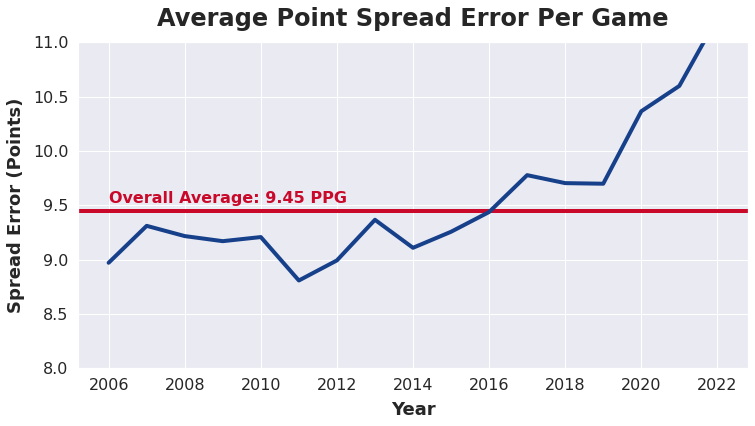

In [20]:
fig, ax = plt.subplots(figsize=(12,6))
ax.set_title('Average Point Spread Error Per Game', fontsize=24, pad=16, fontweight='bold')
ax.set_xlabel('Year', fontsize=18, labelpad=8, fontweight='bold')
ax.set_ylabel('Spread Error (Points)', fontsize=18, labelpad=8, fontweight='bold')
# ax.set_xlim()
ax.set_ylim(top=11, bottom=8)
ax.axhline(9.45, color='#C9082A', linewidth=4)
ax.text(x=2006.01, y=9.52, s='Overall Average: 9.45 PPG', color='#C9082A', fontsize=16, fontweight='bold')

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

sns.lineplot(x = 'game_date', y = 'abs_spread_miss', data = spread_miss_data, ax=ax,
             linewidth=4, color='#17408B')

image_name = 'average_point_spread_error_per_game_over_time'
# plt.savefig(f'../images/{image_name}.png', dpi=300, bbox_inches='tight')

<a id=game_records></a>

# Game Records

## Setting Up Features, Data Manipulation

In [21]:
game_records['vegas_hv_pred'] = game_records['home_line'].apply(lambda x: -x)

In [22]:
game_records['ml_hv_pred'] = game_records['ml_prediction']
game_records['dl_hv_pred'] = game_records['dl_prediction']

In [23]:
game_records['vegas_miss'] = game_records.apply(lambda x: abs(x['game_result'] - x['vegas_hv_pred']),
                                                axis=1)

In [24]:
game_records['model_miss_ml'] = game_records.apply(lambda x: abs(x['game_result'] - x['ml_hv_pred']),
                                                   axis=1)
game_records['model_miss_dl'] = game_records.apply(lambda x: abs(x['game_result'] - x['dl_hv_pred']),
                                                   axis=1)

In [25]:
game_records['ml_model_v_vegas'] = game_records.apply(lambda x: 'vegas' if x['vegas_miss'] < x['model_miss_ml'] else 'ml_model', axis=1)
game_records['dl_model_v_vegas'] = game_records.apply(lambda x: 'vegas' if x['vegas_miss'] < x['model_miss_dl'] else 'dl_model', axis=1)

<a id=data_overview></a>

## Data Overview

In [26]:
game_records.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19833 entries, 0 to 19832
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   game_id              19833 non-null  object        
 1   game_info            19833 non-null  object        
 2   date                 19833 non-null  datetime64[ns]
 3   time                 19833 non-null  object        
 4   home                 19833 non-null  object        
 5   away                 19833 non-null  object        
 6   home_line            19828 non-null  float64       
 7   home_line_price      19833 non-null  int64         
 8   away_line            19828 non-null  float64       
 9   away_line_price      19833 non-null  int64         
 10  ml_prediction        19833 non-null  float64       
 11  ml_pred_direction    19833 non-null  object        
 12  ml_pred_line_margin  19828 non-null  float64       
 13  ml_win_prob          19828 non-

In [27]:
game_records.describe()

,home_line,home_line_price,away_line,away_line_price,ml_prediction,ml_pred_line_margin,ml_win_prob,ml_ev,ml_ev_vig,dl_prediction,dl_pred_line_margin,dl_win_prob,dl_ev,dl_ev_vig,game_score,rec_bet_amount,game_result,vegas_hv_pred,ml_hv_pred,dl_hv_pred,vegas_miss,model_miss_ml,model_miss_dl
count,19828.00000,19833.0,19828.00000,19833.0,19833.00000,19828.00000,19828.00000,19828.00000,19828.00000,19560.00000,19560.00000,19560.00000,19560.00000,19560.00000,19828.00000,19833.00000,19800.00000,19828.00000,19833.00000,19560.00000,19795.00000,19800.00000,19527.00000
mean,-2.85662,-110.0,2.85662,-110.0,2.73269,2.73839,0.80971,61.94135,54.65399,2.58754,7.61763,0.80999,61.99755,54.70766,61.94135,11.13962,2.73419,2.85662,2.73269,2.58754,9.51975,9.92206,8.71500
std,6.40052,0.0,6.40052,0.0,5.32219,2.25974,0.15488,30.97518,29.58130,12.09985,6.25453,0.15502,31.00338,29.60822,30.97518,17.86723,13.69984,6.40052,5.32219,12.09985,7.62714,7.79638,8.17309
min,-22.50000,-110.0,-17.50000,-110.0,-19.25214,0.00004,0.50001,0.00155,-4.49852,-95.90278,0.00117,0.50007,0.01487,-4.48580,0.00155,0.00000,-58.00000,-17.50000,-19.25214,-95.90278,0.00000,0.00021,0.00046
25%,-7.50000,-110.0,-2.50000,-110.0,-0.74293,1.04665,0.67838,35.67680,29.57135,-4.97723,2.89949,0.67853,35.70617,29.59939,35.67680,0.00000,-7.00000,-2.50000,-0.74293,-4.97723,3.50000,3.90298,2.84160
50%,-3.50000,-110.0,3.50000,-110.0,2.70324,2.23769,0.83898,67.79565,60.24484,2.88585,6.17803,0.83837,67.67466,60.12930,67.79565,0.00000,4.00000,3.50000,2.70324,2.88585,8.00000,8.24092,6.32369
75%,2.50000,-110.0,7.50000,-110.0,6.14934,3.84075,0.95540,91.08095,82.48230,10.77857,10.70014,0.95644,91.28868,82.68069,91.08095,27.00000,11.00000,7.50000,6.14934,10.77857,13.50000,14.08395,11.94926
max,17.50000,-110.0,22.50000,-110.0,24.41412,23.75214,1.00000,100.00000,91.00000,75.07364,94.40278,1.00000,100.00000,91.00000,100.00000,45.00000,73.00000,22.50000,24.41412,75.07364,64.50000,69.62589,96.90278


In [28]:
game_records.head()

,game_id,game_info,date,time,home,away,home_line,home_line_price,away_line,away_line_price,ml_prediction,ml_pred_direction,ml_pred_line_margin,ml_win_prob,ml_ev,ml_ev_vig,dl_prediction,dl_pred_direction,dl_pred_line_margin,dl_win_prob,dl_ev,dl_ev_vig,game_score,rec_bet_direction,rec_bet_amount,game_result,vegas_hv_pred,ml_hv_pred,dl_hv_pred,vegas_miss,model_miss_ml,model_miss_dl,ml_model_v_vegas,dl_model_v_vegas
0,20211020NYKBOS,/sport/basketball/nba/boxscore/250532,2021-10-20,00:00:00,NYK,BOS,-2.5,-110,2.5,-110,2.65538,Home,0.15538,0.52741,5.48212,0.73543,NaN,Away,NaN,NaN,NaN,NaN,5.48212,Warning-Models Differ,0.0,4.0,2.5,2.65538,NaN,1.5,1.34462,NaN,ml_model,dl_model
1,20211101NYKTOR,/sport/basketball/nba/boxscore/250657,2021-11-01,00:00:00,NYK,TOR,-7.0,-110,7.0,-110,4.41276,Away,2.58724,0.87389,74.77731,66.91233,-9.50900,Away,16.50900,0.99585,99.16995,90.20730,74.77731,Away,0.0,-9.0,7.0,4.41276,-9.50900,16.0,13.41276,0.50900,ml_model,dl_model
2,20211110CHIDAL,/sport/basketball/nba/boxscore/250723,2021-11-10,00:00:00,CHI,DAL,-3.5,-110,3.5,-110,5.17983,Home,1.67983,0.77138,54.27548,47.33309,0.20975,Away,3.29025,0.70058,40.11615,33.81093,54.27548,Warning-Models Differ,0.0,10.0,3.5,5.17983,0.20975,6.5,4.82017,9.79025,ml_model,vegas
3,20211108CHIBKN,/sport/basketball/nba/boxscore/250706,2021-11-08,00:00:00,CHI,BKN,1.0,-110,-1.0,-110,2.43011,Home,3.43011,0.93549,87.09758,78.67819,12.54586,Home,13.54586,0.98484,96.96754,88.10400,87.09758,Home,9.0,23.0,-1.0,2.43011,12.54586,24.0,20.56989,10.45414,ml_model,dl_model
4,20211112BOSMIL,/sport/basketball/nba/boxscore/250734,2021-11-12,00:00:00,BOS,MIL,-5.5,-110,5.5,-110,2.03357,Away,3.46643,0.93749,87.49782,79.06042,16.19066,Home,10.69066,0.95630,91.26065,82.65392,87.49782,Warning-Models Differ,9.0,9.0,5.5,2.03357,16.19066,3.5,6.96643,7.19066,vegas,vegas


  0%|          | 0/2096 [00:00<?, ?it/s]


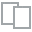
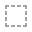
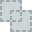
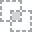
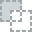
...
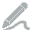
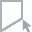
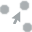
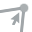
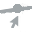

In [29]:
plot(game_records)

<a id=specific_questions_2></a>

## Specific Questions

#### Future Questions
* Does Winning Percentage increase as Game Score increases?
* If I bet $100 on every game, what would my profit loss be?
* If I bet the rec_bet_amount on every game, what would my profit/loss be?

<a id=mpot></a>

### Model Performance Over Time

#### Overall Prediction Miss Average

In [48]:
vegas_miss_avg = round(game_records['vegas_miss'].mean(), 2)
ml_model_miss_avg = round(game_records['model_miss_ml'].mean(), 2)
dl_model_miss_avg = round(game_records['model_miss_dl'].mean(), 2)

In [51]:
print(f'Vegas Miss Average: {vegas_miss_avg}')
print(f'ML Model Miss Average: {ml_model_miss_avg}')
print(f'DL Model Miss Average: {dl_model_miss_avg}')

Vegas Miss Average: 9.52
ML Model Miss Average: 9.92
DL Model Miss Average: 8.72


#### Prediction Miss Average by Year

In [30]:
date_df = game_records.groupby(game_records.date.dt.year).mean()

In [45]:
date_df[['vegas_miss', 'model_miss_ml', 'model_miss_dl']]

,vegas_miss,model_miss_ml,model_miss_dl
date,,,
2006,8.97066,9.68798,8.79113
2007,9.31029,9.72275,8.32030
2008,9.21613,9.44438,8.08855
2009,9.16938,9.45099,8.24994
2010,9.20712,9.47105,8.50809
2011,8.80760,9.10233,8.19668
2012,8.99238,9.44218,7.87126
2013,9.36594,9.73338,8.35056
2014,9.10832,9.44497,8.28708


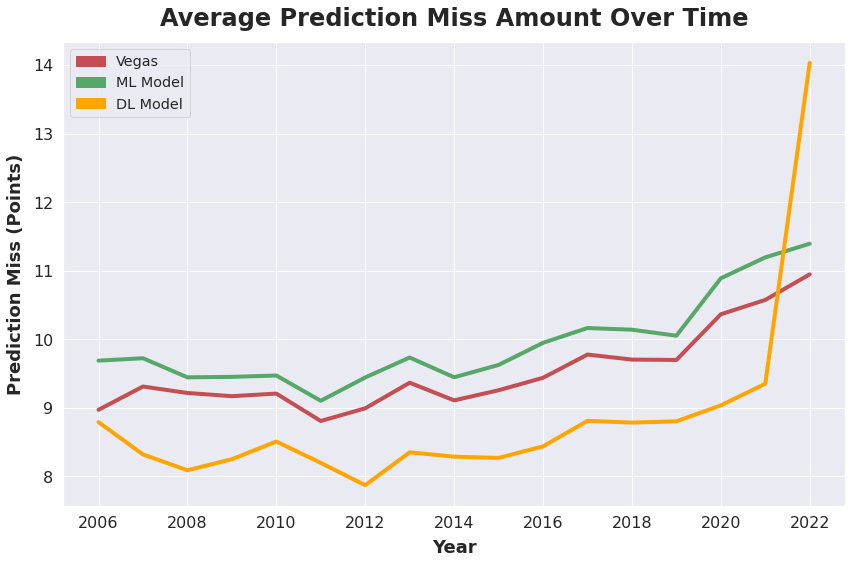

In [31]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(data=date_df, x='date', y='vegas_miss', ax=ax, color='r', linewidth=4)
sns.lineplot(data=date_df, x='date', y='model_miss_ml', ax=ax, color='g', linewidth=4)
sns.lineplot(data=date_df, x='date', y='model_miss_dl', ax=ax, color='orange', linewidth=4)

ax.set_title('Average Prediction Miss Amount Over Time', fontsize=24, pad=16, fontweight='bold')
ax.set_xlabel('Year', fontsize=18, labelpad=8, fontweight='bold')
ax.set_ylabel('Prediction Miss (Points)', fontsize=18, labelpad=8, fontweight='bold')

red_patch = mpatches.Patch(color='r', label='Vegas')
green_patch = mpatches.Patch(color='g', label='ML Model')
orange_patch = mpatches.Patch(color='orange', label='DL Model')
ax.legend(handles=[red_patch, green_patch, orange_patch], fontsize='large')

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

In [32]:
date_df_2 = game_records.groupby([game_records.date.dt.year])

In [33]:
ml_win_pct_by_year = date_df_2['ml_model_v_vegas'].value_counts(normalize=True)[:, 'ml_model']
dl_win_pct_by_year = date_df_2['dl_model_v_vegas'].value_counts(normalize=True)[:, 'dl_model']

In [34]:
model_win_pct_by_year = pd.concat([ml_win_pct_by_year, dl_win_pct_by_year], axis=1).reset_index()

In [35]:
model_win_pct_by_year

,date,ml_model_v_vegas,dl_model_v_vegas
0,2006,0.42488,0.51878
1,2007,0.46008,0.56543
2,2008,0.47419,0.57016
3,2009,0.47964,0.56433
4,2010,0.47654,0.54773
5,2011,0.45959,0.55368
6,2012,0.44485,0.56241
7,2013,0.46618,0.54911
8,2014,0.45577,0.53223
9,2015,0.45716,0.55572


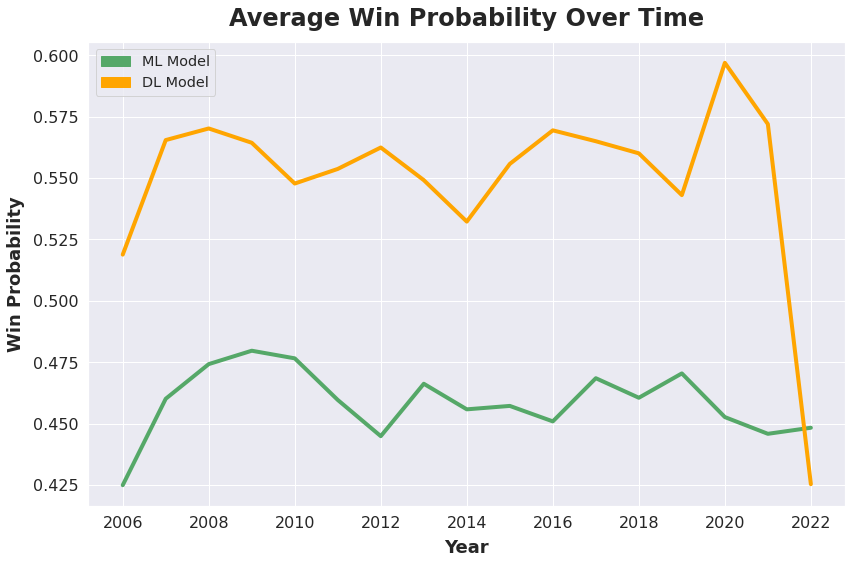

In [36]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(data=model_win_pct_by_year, x='date', y='ml_model_v_vegas', ax=ax, color='g', linewidth=4)
sns.lineplot(data=model_win_pct_by_year, x='date', y='dl_model_v_vegas',
             ax=ax, color='orange', linewidth=4)

ax.set_title('Average Win Probability Over Time', fontsize=24, pad=16, fontweight='bold')
ax.set_xlabel('Year', fontsize=18, labelpad=8, fontweight='bold')
ax.set_ylabel('Win Probability', fontsize=18, labelpad=8, fontweight='bold')

green_patch = mpatches.Patch(color='g', label='ML Model')
orange_patch = mpatches.Patch(color='orange', label='DL Model')
ax.legend(handles=[green_patch, orange_patch], fontsize='large')

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

<a id=dmpvpgp></a>

### Distributions of Model Predictions, Vegas Predictions, and Game Results 

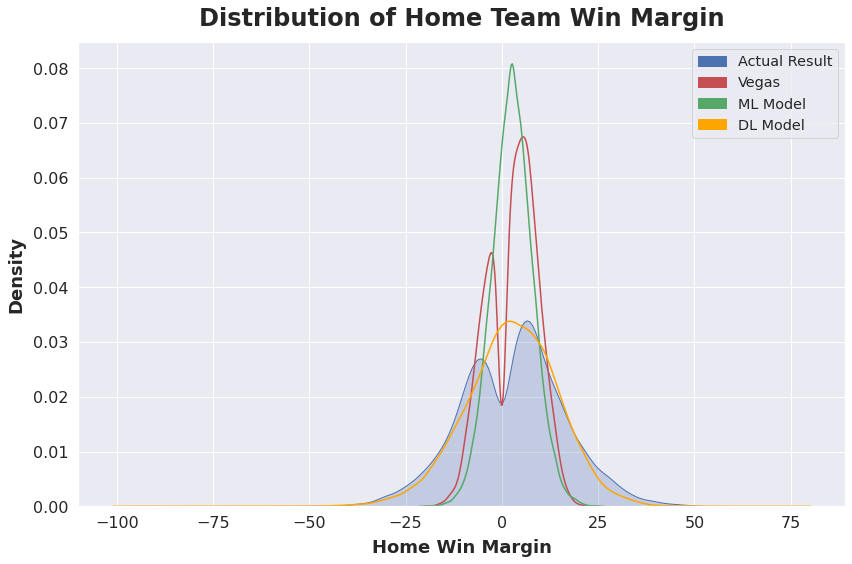

In [37]:
fig, ax = plt.subplots(figsize=(12,8))
sns.kdeplot(data=game_records, x="game_result", ax=ax, color='b', fill=True)
sns.kdeplot(data=game_records, x="vegas_hv_pred", ax=ax, color='r', fill=False)
sns.kdeplot(data=game_records, x="ml_hv_pred", ax=ax, color='g', fill=False)
sns.kdeplot(data=game_records, x="dl_hv_pred", ax=ax, color='orange', fill=False)

ax.set_title('Distribution of Home Team Win Margin', fontsize=24, pad=16, fontweight='bold')
ax.set_xlabel('Home Win Margin', fontsize=18, labelpad=8, fontweight='bold')
ax.set_ylabel('Density', fontsize=18, labelpad=8, fontweight='bold')

blue_patch = mpatches.Patch(color='b', label='Actual Result')
red_patch = mpatches.Patch(color='r', label='Vegas')
green_patch = mpatches.Patch(color='g', label='ML Model')
orange_patch = mpatches.Patch(color='orange', label='DL Model')
ax.legend(handles=[blue_patch, red_patch, green_patch, orange_patch], fontsize='large')

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

<a id='owvlp'></a>

### Overall Winning vs. Losing Predictions
Must win 52.4% to overcome -110 vig

In [38]:
game_records['ml_model_v_vegas'].value_counts(normalize=False)

vegas       10710
ml_model     9123
Name: ml_model_v_vegas, dtype: int64

In [39]:
game_records['ml_model_v_vegas'].value_counts(normalize=True)

vegas       0.54001
ml_model    0.45999
Name: ml_model_v_vegas, dtype: float64

In [40]:
game_records['dl_model_v_vegas'].value_counts(normalize=False)

dl_model    10978
vegas        8855
Name: dl_model_v_vegas, dtype: int64

In [41]:
game_records['dl_model_v_vegas'].value_counts(normalize=True)

dl_model    0.55352
vegas       0.44648
Name: dl_model_v_vegas, dtype: float64

<a id='wpvpm'></a>

### Win Percentage vs. Prediction Margin

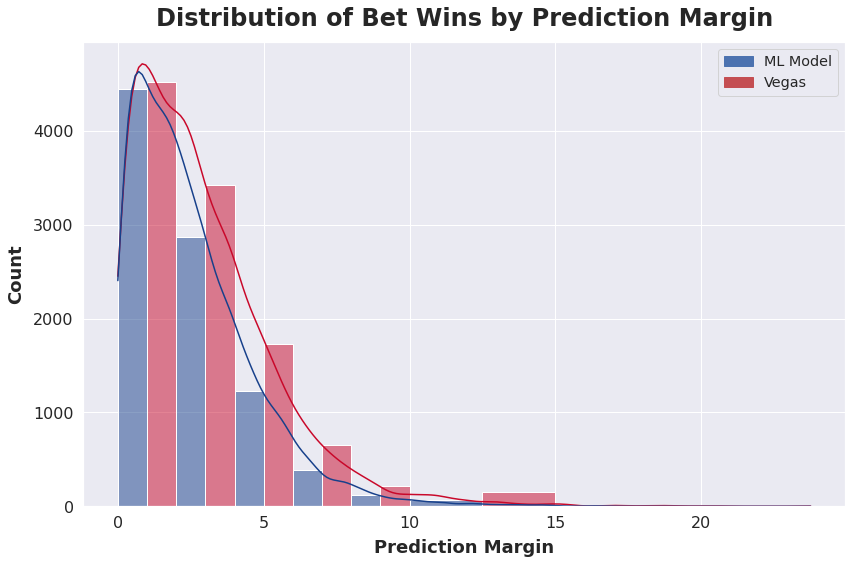

In [42]:
fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(data=game_records, x='ml_pred_line_margin',
             hue='ml_model_v_vegas', kde=True, ax=ax, bins=[0,2,4,6,8,10,15,20],
             palette=('#17408B', '#C9082A'), multiple='dodge')

ax.set_title('Distribution of Bet Wins by Prediction Margin', fontsize=24, pad=16, fontweight='bold')
ax.set_xlabel('Prediction Margin', fontsize=18, labelpad=8, fontweight='bold')
ax.set_ylabel('Count', fontsize=18, labelpad=8, fontweight='bold')

blue_patch = mpatches.Patch(color='b', label='ML Model')
red_patch = mpatches.Patch(color='r', label='Vegas')
ax.legend(handles=[blue_patch, red_patch], fontsize='large')

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

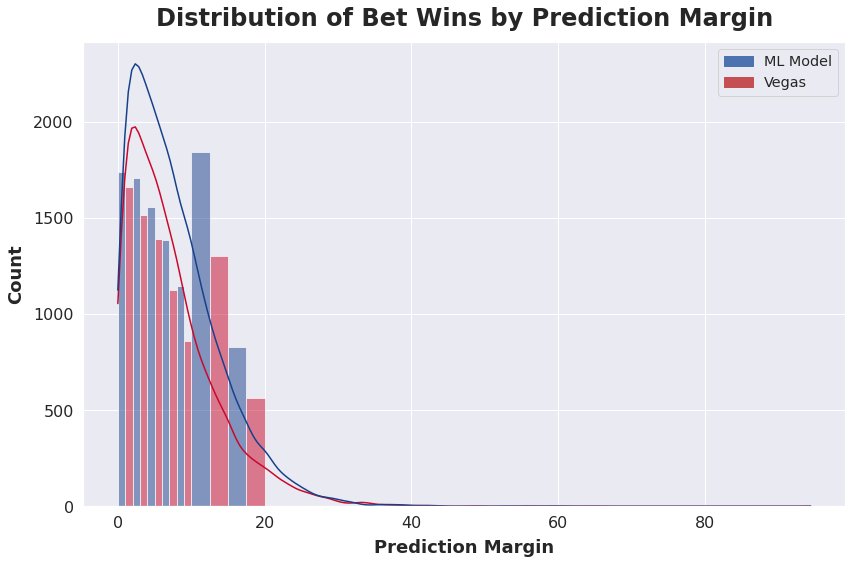

In [43]:
fig, ax = plt.subplots(figsize=(12,8))
sns.histplot(data=game_records, x='dl_pred_line_margin',
             hue='dl_model_v_vegas', kde=True, ax=ax, bins=[0,2,4,6,8,10,15,20],
             palette=('#17408B', '#C9082A'), multiple='dodge')

ax.set_title('Distribution of Bet Wins by Prediction Margin', fontsize=24, pad=16, fontweight='bold')
ax.set_xlabel('Prediction Margin', fontsize=18, labelpad=8, fontweight='bold')
ax.set_ylabel('Count', fontsize=18, labelpad=8, fontweight='bold')

blue_patch = mpatches.Patch(color='b', label='ML Model')
red_patch = mpatches.Patch(color='r', label='Vegas')
ax.legend(handles=[blue_patch, red_patch], fontsize='large')

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

<a id='other'></a>

# Other

<a id='model'></a>

### Model Results

In [32]:
x_data = ['Random Guess', 'ML Model', 'DL Model', 'Profitable']
y_data = [50.0, 51.5, 50.8, 52.4]

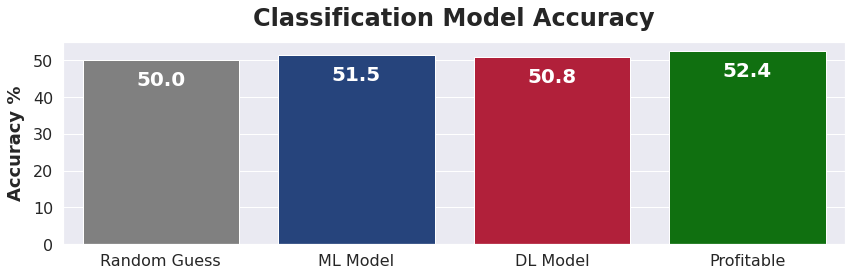

In [35]:
fig, ax = plt.subplots(figsize=(12,4))
ax = sns.barplot(x=x_data, y=y_data,
             palette=('gray','#17408B', '#C9082A','green'))

ax.set_title('Classification Model Accuracy', fontsize=24, pad=16, fontweight='bold')
ax.set_ylabel('Accuracy %', fontsize=18, labelpad=8, fontweight='bold')

for p in ax.patches:
             ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=20, fontweight='bold', color='white', xytext=(0, -20),
                 textcoords='offset points')

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()

image_name = 'classification_model_accuracy'
# plt.savefig(f'../images/{image_name}.png', dpi=300, bbox_inches='tight')